# 🎓 Maestría en Inteligencia Artificial Aplicada

<center>

[![Institution](https://img.shields.io/badge/Institution-Tecnológico%20de%20Monterrey-1F497D?style=for-the-badge&logo=graduation-cap)](https://tec.mx)
[![Course](https://img.shields.io/badge/Course-Computer%20Vision-FF6B6B?style=for-the-badge&logo=eye)](https://tec.mx)
[![Activity](https://img.shields.io/badge/Activity%206.4-Google%20Colab-F9AB00?style=for-the-badge&logo=googlecolab)](https://colab.research.google.com)

</center>

---

## 🖼️ **Visión Computacional para Imágenes y Video**

### 👨‍🏫 **Profesores**
- **Profesor Titular:** Dr. Gilberto Ochoa Ruiz
- **Profesor Asistente:** MIP Ma. del Refugio Melendez Alfaro
- **Profesor Tutor:** M. en C. Jose Angel Martinez Navarro

---

## 📊 **Actividad: Extracción de líneas con algoritmo de Canny**

### 📌 **Detalles de la Actividad**
- **Código:** 6.4 Google Colab
- **Título:** Extracción de líneas con algoritmo de Canny
- **Fecha de entrega:** 📅 Octubre 19, 2025 a las 23:59
- **Formato de entrega:** ZIP
- **Modalidad:** Equipo

---

## 👥 **Team 13**

### 🚀 **Nuestro Equipo**

<table style="width:100%; border:none;">
<tr>
<td style="text-align:center; border:none; padding:20px;">

### **Javier Augusto Rebull Saucedo**
<img src="https://iili.io/KuvsGKx.png" alt="Javier Augusto Rebull Saucedo" width="150">

**Matrícula:** `A01795838`  
🎓 MNA Student

</td>
<td style="text-align:center; border:none; padding:20px;">

### **Juan Carlos Pérez Nava**
<img src="https://iili.io/KuvP4gp.png" alt="Juan Carlos Pérez Nava" width="150">

**Matrícula:** `A01795941`  
🎓 MNA Student

</td>
</tr>
<tr>
<td style="text-align:center; border:none; padding:20px;">

### **Luis Gerardo Sánchez Salazar**
<img src="https://iili.io/KuvLaJp.png" alt="Luis Gerardo Sánchez Salazar" width="150">

**Matrícula:** `A01232963`  
🎓 MNA Student

</td>
<td style="text-align:center; border:none; padding:20px;">

### **Oscar Enrique García García**
<img src="https://iili.io/KuvQx24.png" alt="Oscar Enrique García García" width="150">

**Matrícula:** `A01016093`  
🎓 MNA Student

</td>
</tr>
</table>

---

## 🎯 **Objetivo del Proyecto**

El algoritmo de Canny, como muchos otros métodos de extracción de líneas a partir de imágenes, **es un bloque esencial para muchos algoritmos de procesamiento de imágenes de más alto nivel, así como en algoritmos de detección de objetos** (por ejemplo, rostros o peatones usando el Histogram of Gradients o HoG) y extracción de puntos de interés (método de Harris o el Scale Invariant Feature Transform ó SIFT). Asimismo varios de los parámetros de diseño del método de Canny son muy importantes para entender otros algoritmos de visión computacional, lo que hace que su comprensión sea de suma importancia.

En esta actividad implementaremos el método de extracción de líneas de Canny usando OpenCV y Python desde los aspectos de bajo nivel, modificando los parámetros más importantes para comprender su impacto en el desempeño del algoritmo.

---

# 3. Detección de bordes con el algoritmo de Sobel y Canny

## Tabla de Contenidos
1. [Bibliotecas](#libraries)
2. [Detección de bordes con Sobel](#sobel)
3. [Detección de bordes con Canny](#canny)

# **Detección de bordes con Sobel**
La detección de bordes con el operador Sobel es una técnica clásica en procesamiento de imágenes que permite identificar transiciones abruptas de intensidad, es decir, los contornos o límites entre regiones. Se basa en el cálculo de derivadas discretas para estimar el gradiente de intensidad en cada píxel, lo que permite resaltar los cambios locales en la imagen.

Este método es especialmente útil para detectar bordes verticales y horizontales, y se caracteriza por su simplicidad computacional, lo que lo hace adecuado para aplicaciones en tiempo real. Sin embargo, su sensibilidad al ruido puede limitar su precisión en imágenes con variaciones sutiles o interferencias.

El operador Sobel utiliza dos máscaras convolucionales (también llamadas kernels) de tamaño $3×3$ que se aplican sobre la imagen para calcular el gradiente en las direcciones horizontal y vertical:
- **Sobel-X**: detecta bordes verticales.
- **Sobel-Y**: detecta bordes horizontales.
Cada máscara combina un efecto de suavizado (promedio local) con una derivación direccional, lo que lo hace más robusto que operadores como *Prewitt* o *Roberts* frente a pequeñas variaciones de intensidad.

**Cálculo del gradiente**

$G_x = \text{convolución con máscara horizontal}$

$G_y = \text{convolución con máscara vertical}$

A partir de estos valores, se obtiene:

**Magnitud del gradiente**
$$G = \sqrt{G_x^2 + G_y^2}$$

**Dirección del borde**
$$\theta = \arctan\left(\frac{G_y}{G_x}\right)$$

Ventajas

- Método rápido y fácil de implementar.
- Permite distinguir bordes por orientación (vertical/horizontal).
- Disponible en múltiples bibliotecas: OpenCV, skimage, PIL, entre otras.

Limitaciones

- Sensible al ruido: no incluye suavizado previo.
- Bordes gruesos: no realiza supresión de no máximos.
- Requiere umbralización manual para segmentar bordes relevantes.

# **Detección de bordes con Canny**

La detección de bordes con Canny es un algoritmo multietapa diseñado para identificar contornos precisos y continuos en imágenes digitales. A diferencia de operadores simples como Sobel o Prewitt, Canny incorpora técnicas de suavizado, análisis de gradientes, filtrado direccional y umbralización adaptativa, lo que lo convierte en una herramienta robusta para aplicaciones donde la calidad del borde es crítica.

El algoritmo de Canny fue desarrollado por **John F. Canny** en 1986 como respuesta a la necesidad de un método de detección de bordes que fuera matemáticamente riguroso, robusto ante el ruido y capaz de producir contornos delgados y bien localizados. Su diseño se basa en una formulación variacional que busca optimizar tres criterios fundamentales.

**Etapas del algoritmo**

1. *Suavizado con filtro Gaussiano*

$$I_s = I * G_\sigma$$

donde $G_\sigma$ es el kernel Gaussiano con desviación estándar $\sigma$, que controla el nivel de suavizado.

2. *Cálculo de gradiente*

$$G_x = \frac{\partial I_s}{\partial x}, \quad G_y = \frac{\partial I_s}{\partial y}$$

$$G = \sqrt{G_x^2 + G_y^2}, \quad \theta = \arctan\left(\frac{G_y}{G_x}\right)$$

3. *Supresión de no máximos*

Se conserva solo el máximo local en la dirección del gradiente.

4. *Umbralización doble y seguimiento por histéresis*

Se clasifican los bordes como fuertes, débiles o descartados, y se conectan los débiles si están próximos a bordes fuertes.



## Carga de Librerias <a class="anchor" id="libraries" ></a>

In [ ]:
# ===================================================================
# 1. LIBRERÍAS ESTÁNDAR DE PYTHON
# ===================================================================

import os                  # Operaciones del sistema operativo
import shutil              # Limpieza de archivos
import pathlib             # Manejo orientado a objetos de rutas
import platform            # Información sobre la plataforma
import random
import socket              # Interfaz de red de bajo nivel
import sys                 # Parámetros y funciones específicas del sistema
import time                # Funciones relacionadas con el tiempo
import warnings            # Control de advertencias
from datetime import datetime      # Manejo de fechas y horas
from math import exp, sqrt         # Funciones matemáticas básicas
from urllib.request import urlopen # Solicitudes HTTP básicas
from zoneinfo import ZoneInfo      # Manejo de zonas horarias

# ===================================================================
# 2. LIBRERÍAS DE TERCEROS - CIENCIA DE DATOS, IMÁGENES Y CÓMPUTO CIENTÍFICO
# ===================================================================

import cv2                          # Procesamiento y filtros de imágenes (OpenCV)
import matplotlib.pyplot as plt     # Visualización de imágenes y gráficos
import matplotlib.image as mpimg    # Carga de imágenes con Matplotlib
import numpy as np                  # Operaciones con arrays y matrices
import pillow_heif                  # Soporte para imágenes HEIC/HEIF
import skimage                      # Algoritmos de procesamiento de imágenes
import skimage.color as sc          # Conversión entre espacios de color

from scipy import ndimage           # Filtros y transformaciones multidimensionales
from skimage import exposure        # Ajuste de contraste y corrección gamma
from PIL import Image, ImageOps     # Manipulación básica de imágenes (Pillow)
from scipy.ndimage import convolve  # Aplicación de máscaras convolucionales
from scipy.ndimage import gaussian_filter as gauss  # Suavizado con filtro Gaussiano
from scipy.ndimage import median_filter as med      # Reducción de ruido con filtro mediana

# ===================================================================
# 3. OTRAS LIBRERÍAS DE TERCEROS
# ===================================================================
import gdown               # Descarga de archivos desde Google Drive

# ===================================================================
#  CONFIGURACIÓN Y REGISTROS
# ===================================================================

# Registrar el formato HEIC en PIL
pillow_heif.register_heif_opener()

# Configuración de Matplotlib y Advertencias
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['font.size'] = 10

# Tiempo de inicio
notebook_start_time = time.time()

# ===================================================================
# MENSAJE DE CONFIRMACIÓN
# ===================================================================
print("Python:", sys.version)
print("Ejecutable:", sys.executable)
print("Plataforma:", platform.platform())
print("\n✅ Librerías importadas correctamente y listas para la Visión")
print(f"📅 Timestamp de ejecución Hora de CMDX: {datetime.now(ZoneInfo('America/Mexico_City')).strftime('%Y-%m-%d %H:%M:%S')}")

try:
    with urlopen('https://ipapi.co/country_name/') as response:
        country = response.read().decode('utf-8').strip()
    print(f"🌍 País de ejecución: {country}")
    with urlopen('https://ipapi.co/region/') as response:
        region = response.read().decode('utf-8').strip()
    print(f"🗺️ Estado/Región de ejecución: {region}")
except Exception:
    print("No se pudo determinar el país o estado de ejecución (posiblemente sin conexión a internet).")

Python: 3.13.7 | packaged by Anaconda, Inc. | (main, Sep  9 2025, 19:59:03) [GCC 11.2.0]
Ejecutable: /home/jarcos/miniconda3/envs/vision/bin/python3.13
Plataforma: Linux-5.15.167.4-microsoft-standard-WSL2-x86_64-with-glibc2.39

✅ Librerías importadas correctamente y listas para la Visión
📅 Timestamp de ejecución Hora de CMDX: 2025-10-11 20:49:28
🌍 País de ejecución: Mexico
🗺️ Estado/Región de ejecución: Mexico City


In [ ]:
# ===============================================================
#  PARTE 1: LIMPIEZA INICIAL
# ===============================================================
print("\n--- Limpiando archivos en las carpetas especificadas ---")
# Agregamos la nueva carpeta a la lista de limpieza
directorios_a_limpiar = ["data", "imagenes_nuevas"]

for directorio in directorios_a_limpiar:
    if os.path.exists(directorio):
        print(f"Limpiando contenido de la carpeta '{directorio}'...")
        for filename in os.listdir(directorio):
            file_path = os.path.join(directorio, filename)
            try:
                if os.path.isfile(file_path) or os.path.islink(file_path):
                    os.unlink(file_path)
                elif os.path.isdir(file_path):
                    shutil.rmtree(file_path)
            except Exception as e:
                print(f"Error al eliminar {file_path}: {e}")
        print(f"Carpeta '{directorio}' limpiada.")
    else:
        print(f"La carpeta '{directorio}' no existe, no requiere limpieza.")

# ===============================================================
#  PARTE 2: DESCARGA DE LA IMAGEN DEMO
# ===============================================================
print("\n--- Iniciando la descarga de la imagen demo ---")
output_dir_demo = "data"
if not os.path.exists(output_dir_demo):
    os.makedirs(output_dir_demo)
    print(f"Carpeta '{output_dir_demo}' creada.")

file_id_demo = "1lCrQws3c835E5LCp438TkPwJV0ULQ1GD"
filename_demo = "image.jpg"
output_path_demo = os.path.join(output_dir_demo, filename_demo)

print(f"Descargando '{filename_demo}' en '{output_dir_demo}'...")
gdown.download(id=file_id_demo, output=output_path_demo, quiet=False)


--- Limpiando archivos en las carpetas especificadas ---
Limpiando contenido de la carpeta 'data'...
Carpeta 'data' limpiada.
La carpeta 'imagenes_nuevas' no existe, no requiere limpieza.

--- Iniciando la descarga de la imagen demo ---
Descargando 'image.jpg' en 'data'...


Downloading...
From: https://drive.google.com/uc?id=1lCrQws3c835E5LCp438TkPwJV0ULQ1GD
To: /home/jarcos/data/image.jpg
100%|████████████████████████████████████████████████████████████████████████████████| 105k/105k [00:00<00:00, 1.34MB/s]


'data/image.jpg'

## Detección de bordes con Sobel <a class="anchor" id="sobel" ></a>

Como primer paso en la extracción de características, se aplicará el algoritmo de detección de bordes de Sobel. Este método identifica regiones de la imagen donde existen grandes variaciones en la intensidad de píxeles, es decir, zonas con altos valores de gradiente en múltiples direcciones. Estas regiones suelen corresponder a bordes o transiciones significativas dentro de la imagen.
El código en la celda siguiente aplica el operador Sobel sobre una imagen previamente filtrada con mediana, siguiendo los pasos descritos a continuación:
1. **Conversión a escala de grises**: se transforma la imagen a blanco y negro para facilitar el cálculo del gradiente, ya que este se realiza sobre una matriz bidimensional.
2. **Cálculo del gradiente en direcciones X e Y**: se estiman los cambios de intensidad en los ejes horizontal y vertical.
3. **Cálculo de la magnitud del gradiente**: se combina la información direccional para obtener la intensidad total del cambio.
4. **Normalización de los valores del gradiente**: se ajustan los valores obtenidos para que estén en un rango común, facilitando su visualización y análisis posterior.


**Descripción de la función `edge_sobel`**

La siguiente función aplica el operador de *Sobel* para detectar bordes en una imagen. A continuación se detallan las operaciones que realiza:

- `sc.rgb2gray(image)`

Convierte la imagen de color (RGB) a escala de grises. Esto es necesario porque el cálculo de gradientes se realiza sobre una matriz bidimensional

- `ndimage.sobel(image, 1) `

Calcula la derivada en la dirección horizontal (eje $X$), lo que permite detectar bordes verticales.

- `ndimage.sobel(image, 0)`

Calcula la derivada en la dirección vertical (eje $Y$), útil para detectar bordes horizontales.

- `mag = np.hypot(dx, dy)`

Calcula la magnitud del gradiente combinando las derivadas horizontal y vertical:

$$\text{mag} = \sqrt{dx^2 + dy^2}$$

Esto proporciona una medida de la intensidad del cambio en cada píxel.

- `mag *= 255.0 / np.amax(mag)`

Normaliza los valores de magnitud al rango [0, 255], lo que permite visualizar el resultado como una imagen en escala de grises.


- `mag.astype(np.uint8)`

Convierte los valores a tipo `uint8` (enteros de 8 bits), el formato estándar para imágenes en escala de grises.

La función devuelve una imagen en escala de grises donde los bordes están resaltados según la magnitud del gradiente. Este resultado es especialmente útil como paso de preprocesamiento en tareas de segmentación, reconocimiento de objetos o análisis estructural en imágenes.



In [ ]:
def edge_sobel(image):
    image = sc.rgb2gray(image) # Convert color image to gray scale
    dx = ndimage.sobel(image, 1)  # horizontal derivative
    dy = ndimage.sobel(image, 0)  # vertical derivative
    mag = np.hypot(dx, dy)  # magnitude
    mag *= 255.0 / np.amax(mag)  # normalize (Q&D)
    mag = mag.astype(np.uint8)
    return mag

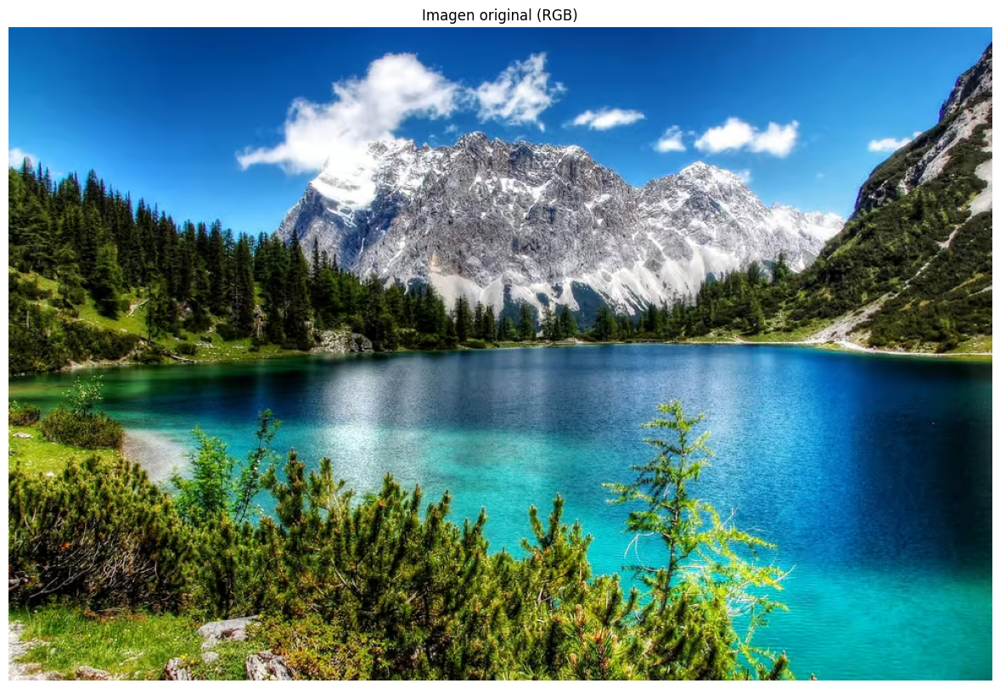

Objeto: <class 'numpy.ndarray'>
Tamaño (Alto x ancho): 650 x 978
Modo de color: 3 canales (RGB)
Total de valores en el arreglo: 1,907,100


In [ ]:

path = os.path.join('data', 'image.jpg')

# Cargar imagen en formato BGR y convertir a RGB
original_image = cv2.imread(path)
original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

# Mostrar imagen
plt.imshow(original_image_rgb)
plt.axis('off')  # Oculta ejes para visualización limpia
plt.title('Imagen original (RGB)')
plt.show()

# Extraer dimensiones
height, width, channels = original_image_rgb.shape
total_pixels = original_image_rgb.size

# Imprimir propiedades con formato y color
info = [
    ("Objeto", type(original_image_rgb)),
    ("Tamaño (Alto x ancho)", f"{height} x {width}"),
    ("Modo de color", f"{channels} canales (RGB)"),
    ("Total de valores en el arreglo", f"{total_pixels:,}")
]

for label, value in info:
    print(f"{label}: \033[36m{value}\033[0m")


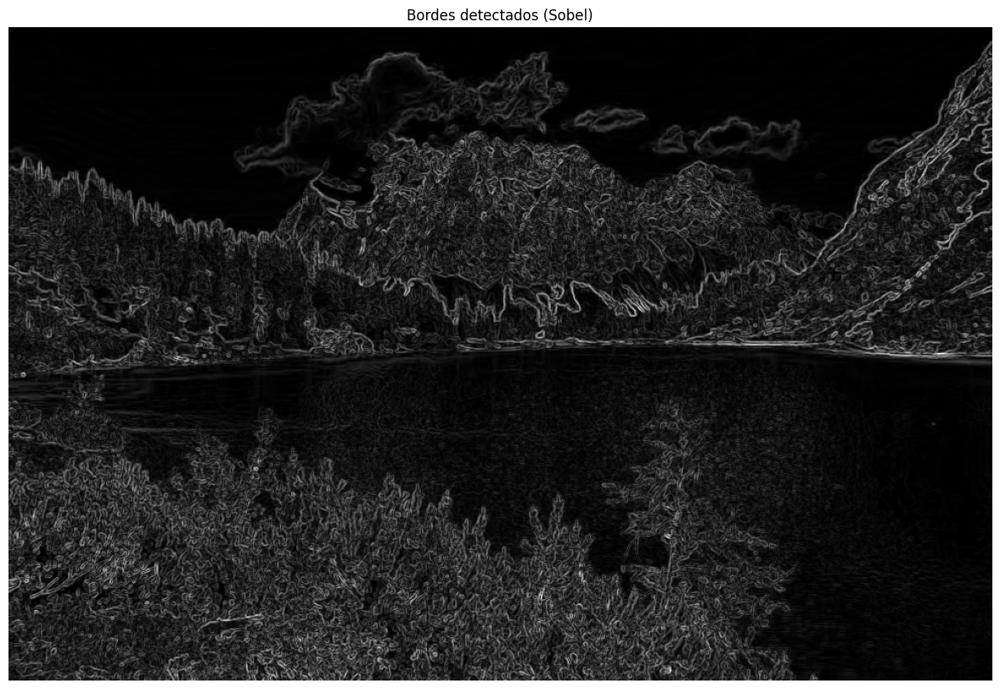

Tipo de objeto: <class 'numpy.ndarray'>
Forma (alto, ancho): (650, 978)
Tipo de datos: uint8
Rango de valores: 0 a 255
Número total de elementos: 635,700


In [ ]:
img_med = med(original_image_rgb, size=2)
img_edge = edge_sobel(img_med)

plt.imshow(img_edge, cmap="gray")
plt.axis("off")
plt.title("Bordes detectados (Sobel)")
plt.show()

print(f"Tipo de objeto: \033[36m{type(img_edge)}\033[0m")
print(f"Forma (alto, ancho{', canales' if img_edge.ndim == 3 else ''}): \033[36m{img_edge.shape}\033[0m")
print(f"Tipo de datos: \033[36m{img_edge.dtype}\033[0m")
print(f"Rango de valores: \033[36m{np.min(img_edge)} a {np.max(img_edge)}\033[0m")
print(f"Número total de elementos: \033[36m{img_edge.size:,}\033[0m")


Aplicación del filtro *Gaussiano* para suavizado

- `gauss` es un alias para `scipy.ndimage.gaussian_filter`, una función que aplica un suavizado Gaussiano sobre una imagen. Este tipo de filtro difumina los valores de los píxeles en función de su proximidad, reduciendo el ruido y las variaciones locales.

- El parámetro `sigma=1` controla el grado de difuminado:
  - Valores bajos (como 1) producen un suavizado leve.
  - Valores altos generan un desenfoque más pronunciado.

Este proceso es útil para atenuar el ruido y eliminar detalles menores, lo que puede mejorar la detección de bordes o estructuras más amplias en etapas posteriores del procesamiento.


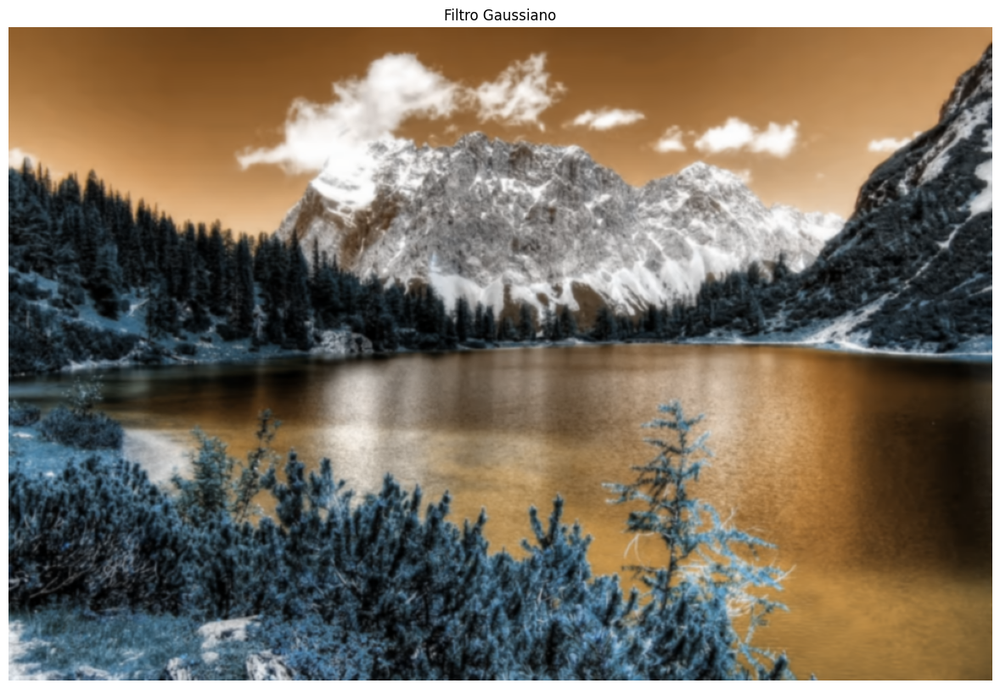

Tipo de objeto: <class 'numpy.ndarray'>
Forma (alto, ancho): (650, 978)
Tipo de datos: uint8
Rango de valores: 0 a 255
Número total de elementos: 635,700


In [ ]:
img_gauss = gauss(original_image, sigma=1)
plt.imshow(img_gauss)
plt.axis("off")
plt.title("Filtro Gaussiano")
plt.show()

print(f"Tipo de objeto: \033[36m{type(img_edge)}\033[0m")
print(f"Forma (alto, ancho{', canales' if img_edge.ndim == 3 else ''}): \033[36m{img_edge.shape}\033[0m")
print(f"Tipo de datos: \033[36m{img_edge.dtype}\033[0m")
print(f"Rango de valores: \033[36m{np.min(img_edge)} a {np.max(img_edge)}\033[0m")
print(f"Número total de elementos: \033[36m{img_edge.size:,}\033[0m")

Aplicando detección de bordes con Sobel sobre una imagen suavizada mediante filtro Gaussiano

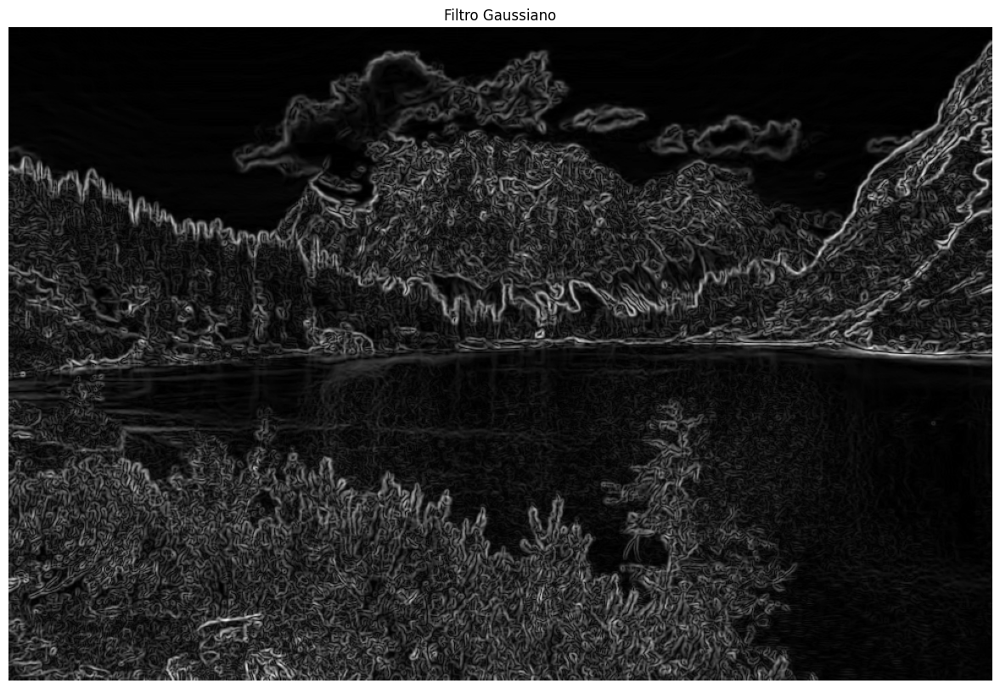

Tipo de objeto: <class 'numpy.ndarray'>
Forma (alto, ancho): (650, 978)
Tipo de datos: uint8
Rango de valores: 0 a 255
Número total de elementos: 635,700


In [ ]:
img_edge = edge_sobel(img_gauss)
plt.imshow(img_edge, cmap="gray")
plt.axis("off")
plt.title("Filtro Gaussiano")
plt.show()

print(f"Tipo de objeto: \033[36m{type(img_edge)}\033[0m")
print(f"Forma (alto, ancho{', canales' if img_edge.ndim == 3 else ''}): \033[36m{img_edge.shape}\033[0m")
print(f"Tipo de datos: \033[36m{img_edge.dtype}\033[0m")
print(f"Rango de valores: \033[36m{np.min(img_edge)} a {np.max(img_edge)}\033[0m")
print(f"Número total de elementos: \033[36m{img_edge.size:,}\033[0m")

## Detección de bordes con Canny <a class="anchor" id="canny" ></a>

**Detección de bordes con el algoritmo Canny**

La detección de bordes con Canny es un enfoque multietapa que permite identificar contornos precisos en una imagen. El proceso incluye los siguientes pasos:

1. **Reducción de ruido**
Se aplica un filtro *Gaussiano* para suavizar la imagen y minimizar el impacto del ruido en los bordes detectados.

2. **Cálculo del gradiente**
Se calcula la magnitud y dirección del gradiente de intensidad para identificar zonas con cambios abruptos.

3. **Supresión de no máximos**
Se eliminan los píxeles que no corresponden al punto más intenso del borde en su dirección, afinando los contornos.

4. **Umbral doble (Double Threshold)**
Se clasifican los píxeles en bordes fuertes, débiles o irrelevantes según su intensidad.

5. **Seguimiento de bordes por histéresis**
Se conservan los bordes débiles que están conectados a bordes fuertes, descartando los aislados.

Requisito previo: La imagen debe estar en escala de grises antes de aplicar el algoritmo.


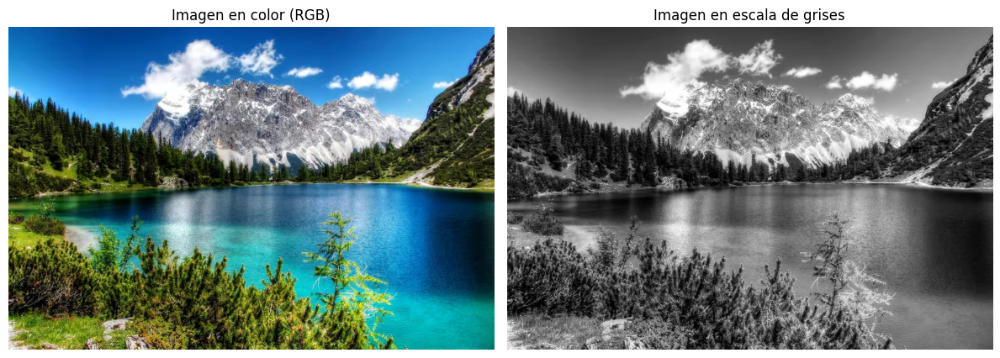

In [ ]:
path = os.path.join('data', 'image.jpg')

img = cv2.imread(path)

img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.title("Imagen en color (RGB)")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")
plt.title("Imagen en escala de grises")
plt.axis("off")

plt.tight_layout()
plt.show()


### 1. Reducción de ruido
La detección de bordes es altamente sensible al ruido en la imagen, debido al uso de derivadas en el algoritmo. Para mitigar este efecto, se aplica un filtro `Gaussiano`, que suaviza la imagen antes de calcular los gradientes.

El tamaño del kernel `Gaussiano` determina el grado de difuminado:

- Kernels pequeños producen un suavizado leve.
- Kernels grandes generan un desenfoque más pronunciado.


La ecuación del kernel `Gaussiano` de tamaño $(2k+1) \times (2k+1)$

$$
H_{i, j} = \frac{1}{2\pi\sigma^2}exp(-\frac{(i-(k+1))^2 + (j-(k+1))^2}{2\sigma^2}); 1\leq i, j \leq (2k+1)
$$

In [ ]:
def gaussian_kernel(size, sigma=1):
    size = int(size) // 2
    x, y = np.mgrid[-size:size+1, -size:size+1]
    normal = 1 / (2.0 * np.pi * sigma**2)
    g =  np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
    return g

### 1.1 Parametro Sigma $\sigma$

 El parámetro σ (sigma) representa la desviación estándar de la distribución Gaussiana utilizada para suavizar la imagen.

- Sigma controla cuánto se difumina la imagen.
- En términos matemáticos, define la dispersión de los valores del kernel Gaussiano alrededor del centro.
- Cuanto mayor sea sigma, más amplia será la campana Gaussiana, y más se promediarán los valores de los píxeles vecinos.

<table border="1" cellpadding="8" cellspacing="0" style="border-collapse: collapse; font-family: Arial, sans-serif;">
  <thead style="background-color: #f2f2f2;">
    <tr>
      <th>Valor de σ (sigma)</th>
      <th>Efecto en la imagen</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td><strong>0.5 – 1</strong></td>
      <td>Suavizado leve. Se conserva la mayoría de los detalles finos.</td>
    </tr>
    <tr>
      <td><strong>2 – 3</strong></td>
      <td>Difuminado moderado. Se reduce el ruido sin perder estructuras importantes.</td>
    </tr>
    <tr>
      <td><strong>5 o más</strong></td>
      <td>Suavizado fuerte. Se eliminan bordes y texturas pequeñas, útil para resaltar formas grandes.</td>
    </tr>
  </tbody>
</table>


In [ ]:
#sigma_values = [1, 3, 5, 10, 20]
#sigma = random.choice(sigma_values)
#print(f"Valor seleccionado aleatoriamente: \033[36m{sigma}\033[0m")

sigma = 10

print(f"Valor seleccionado para sigma: \033[36m{sigma}\033[0m")

Valor seleccionado para sigma: 10


### 1.2 El parámetro Kernel Size

El tamaño del kernel es fundamental en muchos algoritmos de procesamiento de imágenes, especialmente en filtros como el *Gaussiano*, *mediana*, *Sobel*, *Canny*, entre otros. Afecta directamente la forma en que se procesan los píxeles vecinos y, por tanto, el resultado visual y analítico de la operación.


In [ ]:
kernel_size = 3

Este fragmento de código realiza un proceso de suavizado mediante convolución con un kernel Gaussiano generado manualmente. El objetivo es reducir el ruido y las variaciones locales antes de aplicar operaciones posteriores como detección de bordes.

1. `gaussian_kernel(kernel_size, sigma)`
- Genera un **kernel Gaussiano bidimensional** de tamaño *kernel_size × kernel_size*.
- El parámetro ***sigma*** controla el grado de difuminado:
  - Valores bajos producen un suavizado leve.
  - Valores altos generan un desenfoque más pronunciado.
- El kernel contiene valores que simulan una distribución *Gaussiana* centrada, con mayor peso en el centro y decreciente hacia los bordes.

2. `convolve(img_gray, kernel)`
- Aplica una convolución entre la imagen en escala de grises y el kernel `Gaussiano` generado.
- Cada píxel se reemplaza por una combinación ponderada de sus vecinos, según los valores del kernel.
- El resultado es una imagen suavizada, con ruido atenuado y transiciones más suaves, ideal para mejorar la estabilidad de algoritmos sensibles como la detección de bordes.


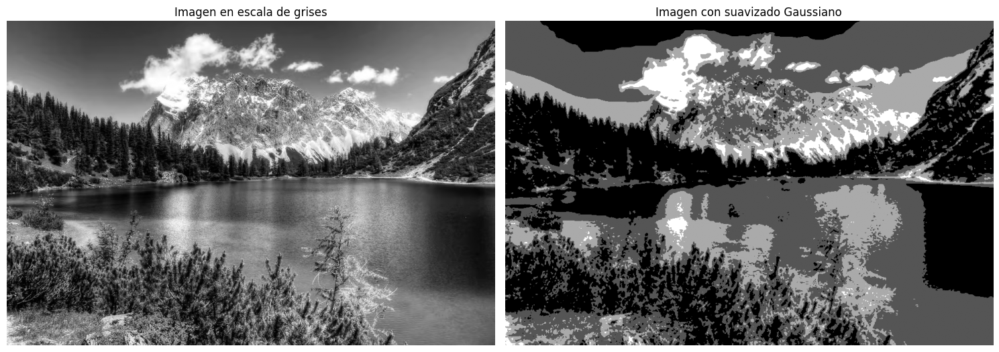

In [ ]:
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.title("Imagen en escala de grises")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_gaussian, cmap="gray")
plt.title("Imagen con suavizado Gaussiano")
plt.axis("off")

plt.tight_layout()
plt.show()

### 2. Cálculo del gradiente

Los bordes en una imagen corresponden a cambios abruptos en la intensidad de los píxeles. Para detectarlos, una forma efectiva es aplicar filtros que resalten estos cambios en ambas direcciones:
- horizontal $(x)$
- vertical $(y)$

Esto se puede implementar mediante la convolución de la imagen
$I$ con los kernels de *Sobel kernels* $Kx$ and $Ky$

$$
K_x = \begin{bmatrix}
-1 & 0 & 1\\
-2 & 0 & 2\\
-1 & 0 & 1
\end{bmatrix}, K_y = \begin{bmatrix}
1 & 2& 1\\
0 & 0 & 0\\
-1 & -2 & -1
\end{bmatrix}
$$

Luego, se calcula la magnitud del gradiente $G$ y su orientación $\theta$ en cada punto:

$$
|G| = \sqrt{I_x^2 + I_y^2},
\theta(x, y) = arctan(\frac{I_y}{I_x})
$$

Donde $I_x$ e $I_y$ son las imágenes resultantes de aplicar los kernels $K_x$ y $K_y$, respectivamente.


In [ ]:
def sobel_filters(img):
    Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)

    Ix = ndimage.filters.convolve(img, Kx)
    Iy = ndimage.filters.convolve(img, Ky)

    G = np.hypot(Ix, Iy)
    G = G / G.max() * 255
    theta = np.arctan2(Iy, Ix)

    return (G, theta)

(np.float64(-0.5), np.float64(977.5), np.float64(649.5), np.float64(-0.5))

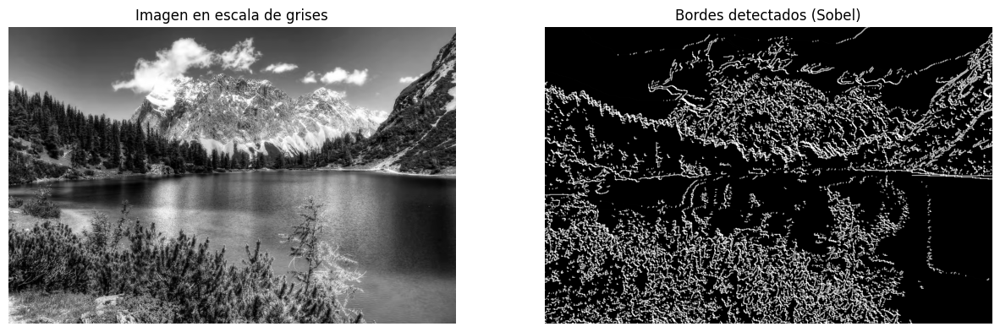

In [ ]:
G, theta = sobel_filters(img_gaussian)

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.title("Imagen en escala de grises")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(G, cmap="gray")
plt.title("Bordes detectados (Sobel)")
plt.axis("off")

### 3. Supresión de no máximos (Non-Maximum Suppression)

Este paso tiene como objetivo refinar los bordes detectados, eliminando aquellos que no representan un cambio máximo en la dirección del gradiente.

**Procedimiento:**

1. **Inicializar una matriz** del mismo tamaño que la imagen de magnitud del gradiente, con todos los valores en cero.
2. **Determinar la dirección del borde** en cada píxel, utilizando los valores del ángulo calculado previamente.
3. **Comparar intensidades**: verificar si el píxel actual tiene una magnitud mayor que sus vecinos en la dirección del gradiente.
4. **Conservar solo los máximos locales**: si el píxel es el más intenso en su dirección, se conserva; de lo contrario, se suprime.
5. **Devolver la imagen refinada**, con bordes más delgados y precisos


In [ ]:
def non_max_suppression(img, D):
    M, N = img.shape
    Z = np.zeros((M,N), dtype=np.int32)
    angle = D * 180. / np.pi
    angle[angle < 0] += 180


    for i in range(1,M-1):
        for j in range(1,N-1):
            try:
                q = 255
                r = 255

               #angle 0
                if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                    q = img[i, j+1]
                    r = img[i, j-1]
                #angle 45
                elif (22.5 <= angle[i,j] < 67.5):
                    q = img[i+1, j-1]
                    r = img[i-1, j+1]
                #angle 90
                elif (67.5 <= angle[i,j] < 112.5):
                    q = img[i+1, j]
                    r = img[i-1, j]
                #angle 135
                elif (112.5 <= angle[i,j] < 157.5):
                    q = img[i-1, j-1]
                    r = img[i+1, j+1]

                if (img[i,j] >= q) and (img[i,j] >= r):
                    Z[i,j] = img[i,j]
                else:
                    Z[i,j] = 0

            except IndexError as e:
                pass

    return Z

El código `img_nonmax = non_max_suppression(G, theta)` aplica el algoritmo de supresión de no máximos sobre una imagen, como parte del proceso de detección de bordes. Aquí te explico paso a paso qué hace y por qué es importante:

- **Entrada** `G`: matriz de magnitud del gradiente, que indica qué tan fuerte es el cambio de intensidad en cada píxel.
- **Entrada** `theta`: matriz de direcciones del gradiente (ángulos), que indica hacia dónde se orienta ese cambio.

**El Propósito del algoritmo**
Eliminar los píxeles que **no son máximos locales** en la dirección del gradiente, dejando solo los puntos más intensos que representan bordes reales.

**¿Cómo  lo hace?**
- **Inicializa una matriz** vacía del mismo tamaño que `G`, con todos sus valores en ceros.
- Recorre cada píxel de `G` y consulta su dirección de gradiante en la matriz `theta`.
- Compara la magnitud del píxel con sus dos vecinos en la dirección del gradiente.
- **Conserva el píxel** si su valor es mayor que el de sus vecinos en esa dirección (es un máximo local).
- **Suprime** (lo pone en cero) si no representa el valor más intenso en su trayectoria de gradiente.



(np.float64(-0.5), np.float64(977.5), np.float64(649.5), np.float64(-0.5))

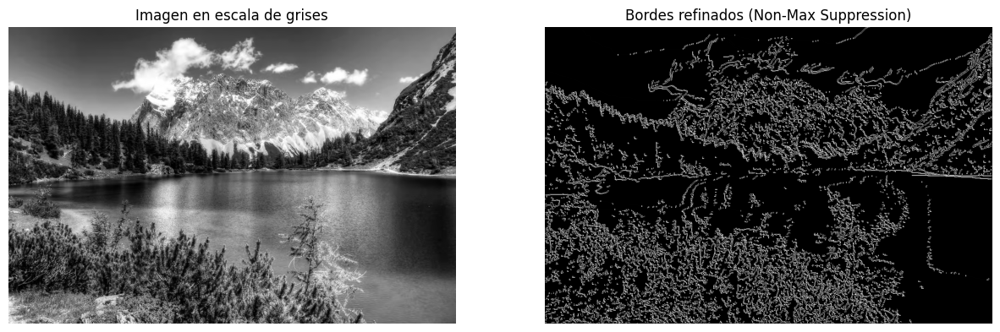

In [ ]:
img_nonmax = non_max_suppression(G, theta)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.title("Imagen en escala de grises")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_nonmax, cmap="gray")
plt.title("Bordes refinados (Non-Max Suppression)")
plt.axis("off")

### 4. Umbral doble (Double Threshold)

Este paso clasifica los píxeles según su intensidad, para decidir cuáles forman parte de los bordes finales:
- **Píxeles fuertes**: tienen una intensidad tan alta que se considera con certeza que forman parte del borde final.
- **Píxeles débiles**: su intensidad no es suficiente para clasificarlos como fuertes, pero tampoco tan baja como para descartarlos completamente.
- **Otros píxeles**: se consideran irrelevantes para la detección de bordes y se eliminan del resultado.

Este código implementa la etapa de umbralización doble (Double Threshold) dentro de un pipeline de detección de bordes.
Clasificar los píxeles de una imagen (normalmente la magnitud del gradiente) en tres categorías:
- Fuertes: claramente parte de un borde.
- Débiles: posiblemente parte de un borde.
- Irrelevantes: descartados.



In [ ]:
def threshold(img, lowThresholdRatio=0.05, highThresholdRatio=0.09):

    highThreshold = img.max() * highThresholdRatio;
    lowThreshold = highThreshold * lowThresholdRatio;

    M, N = img.shape
    res = np.zeros((M,N), dtype=np.int32)

    weak = np.int32(25)
    strong = np.int32(255)

    strong_i, strong_j = np.where(img >= highThreshold)
    zeros_i, zeros_j = np.where(img < lowThreshold)

    weak_i, weak_j = np.where((img <= highThreshold) & (img >= lowThreshold))

    res[strong_i, strong_j] = strong
    res[weak_i, weak_j] = weak

    return (res)

(np.float64(-0.5), np.float64(977.5), np.float64(649.5), np.float64(-0.5))

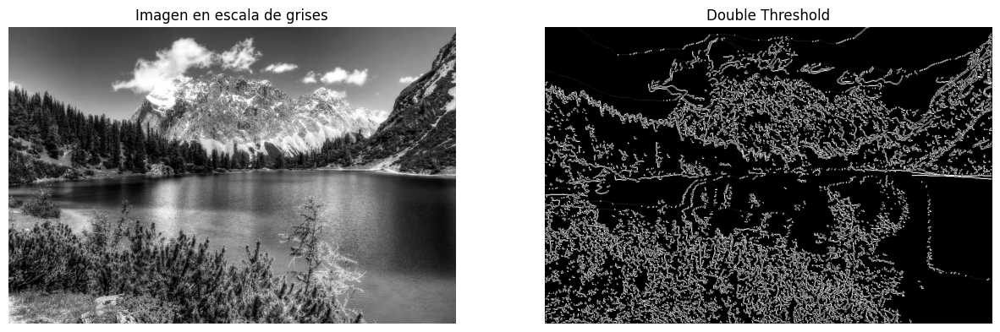

In [ ]:
img_threshold = threshold(img_nonmax)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.title("Imagen en escala de grises")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_threshold, cmap="gray")
plt.title("Double Threshold")
plt.axis("off")

### 5. Edge Tracking by Hysteresis

The hysteresis consists of transforming weak pixels into strong ones, if and only if at least one of the pixels around the one being processed is a strong one

In [ ]:
def hysteresis(img, weak = 75, strong=255):
    M, N = img.shape
    for i in range(1, M-1):
        for j in range(1, N-1):
            if (img[i,j] == weak):
                try:
                    if ((img[i+1, j-1] == strong) or (img[i+1, j] == strong) or (img[i+1, j+1] == strong)
                        or (img[i, j-1] == strong) or (img[i, j+1] == strong)
                        or (img[i-1, j-1] == strong) or (img[i-1, j] == strong) or (img[i-1, j+1] == strong)):
                        img[i, j] = strong
                    else:
                        img[i, j] = 0
                except IndexError as e:
                    pass
    return img

(np.float64(-0.5), np.float64(977.5), np.float64(649.5), np.float64(-0.5))

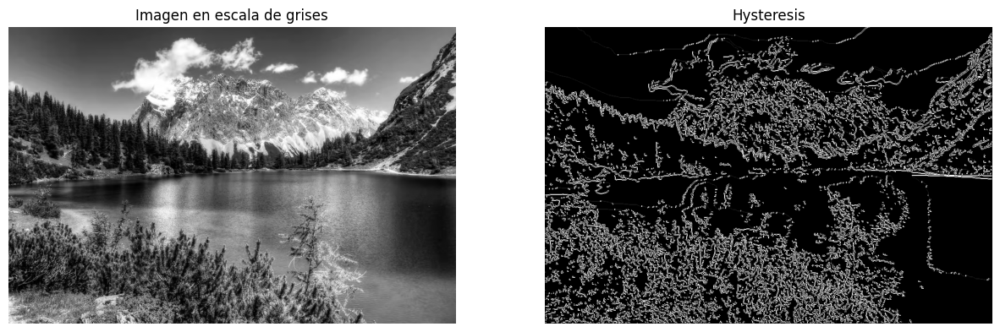

In [ ]:
img_final = hysteresis(img_threshold)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.title("Imagen en escala de grises")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_final, cmap="gray")
plt.title("Hysteresis")
plt.axis("off")

modifiquen algunos parámetros para que se comprenda mejor el codigo:  
1. modifica el valor de sigma y observa los cambios en las lineas detectas,
2. Analiza el comportamiento del Canny Detector con y sin remoción de ruido,
3. Experimenta con imágenes con diferentes cantidad de lineas y textura para observar el comportamiento del algoritmo

In [ ]:
# TODO: Challenge